## MUSI - Image Analysis 

### Crowd Counting Project

### Imports

In this section, the required libraries are imported for used.

In [1]:
import os

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from src.utils import read_annotations_data, show_data_distribution, plot_validation_results

### Data Loading

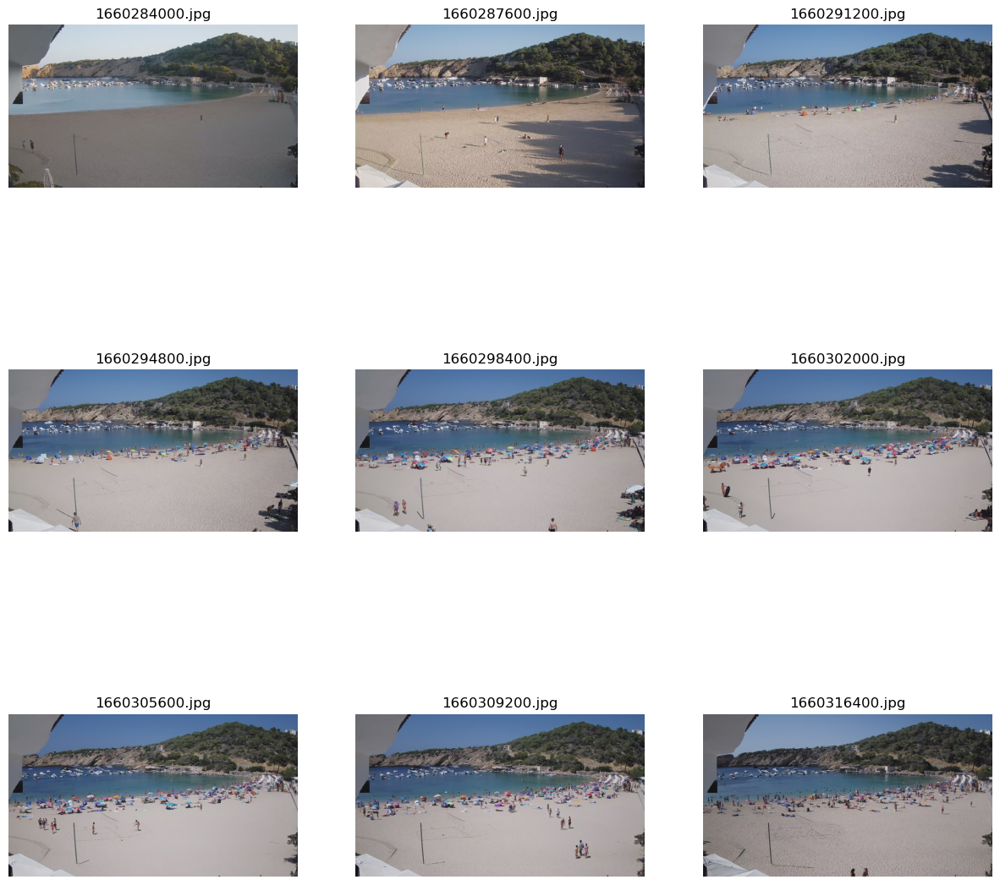

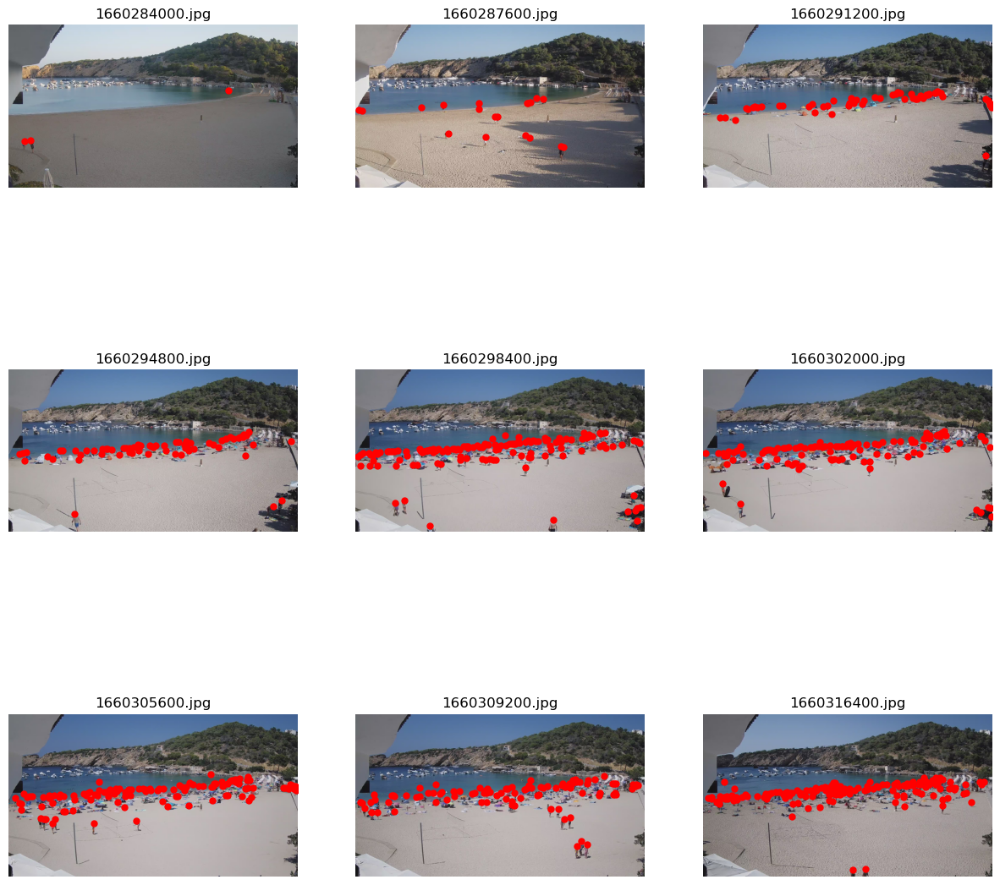

In [2]:
annotations = read_annotations_data('./data', show_img=True, show_annotations=True)

### Data Distribution

We display the data distribution below showing the number of annotations per image. We can observe that some images such as 166032000.jpg and 166030200.jpg having a higher number of people. This increases the complexity of the images and necessitates techniques that would robustly handly these complex image types.



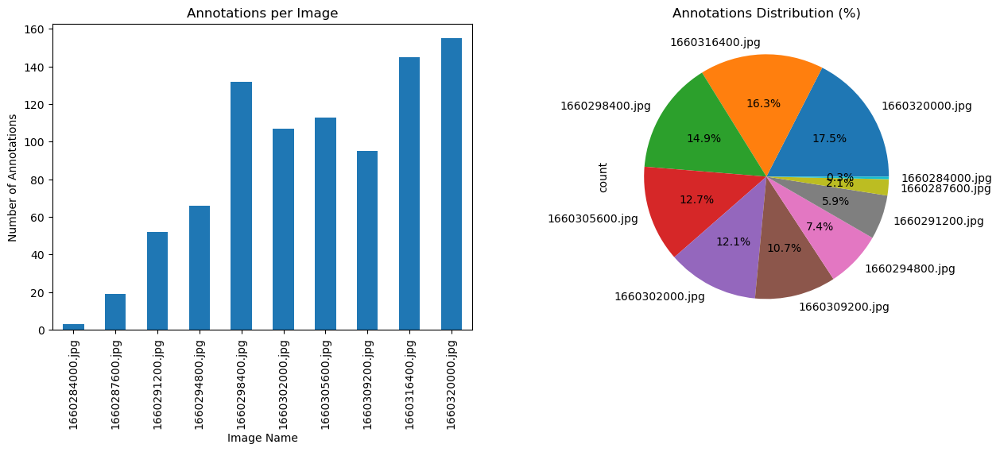

In [3]:
show_data_distribution(annotations)

## Techniques

### Contour Detection

This section introduces the first algorithm used for the project - Contour Detection. The image is preprocessed using techniques such as CLAHE, converting to the LAB colour space, segmentation with the foreground and colour edge detection. Lastly, the contour detection from OpenCV is applied to get the number of contours in the image.

In [4]:
from src.ContourDetection import ContourDetector

In [5]:
contour_detector = ContourDetector(manual_annotations=annotations)

In [6]:
# Set show_image to True to see the images as they are processed
contour_predictions = contour_detector.process_images(show_image=False)

C:\Users\mraix\OneDrive\Documentos\1Semestre_24_25\imagenes\crowd_counting\src\PerformanceMonitor.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.metrics = pd.concat([self.metrics, new_row], ignore_index=True)


In [7]:
contour_detector.metrics

,function,image_name,time_took,cpu_cycles,memory_usage,memory_peak
0,_process_image,1660287600.jpg,0.042499,0.062500,1.92578125 MB,53.918576 MB
1,_process_image,1660291200.jpg,0.042242,0.015625,-0.15625 MB,53.914544 MB
2,_process_image,1660294800.jpg,0.052219,0.031250,-0.02734375 MB,53.914544 MB
3,_process_image,1660298400.jpg,0.046557,0.031250,0.4296875 MB,53.914544 MB
4,_process_image,1660302000.jpg,0.046481,0.031250,0.7890625 MB,53.914544 MB
5,_process_image,1660305600.jpg,0.044437,0.078125,0.3984375 MB,53.914544 MB
6,_process_image,1660309200.jpg,0.047694,0.031250,-0.55078125 MB,53.914544 MB
7,_process_image,1660316400.jpg,0.046130,0.000000,1.12890625 MB,53.914544 MB
8,_process_image,1660320000.jpg,0.046751,0.015625,0.28515625 MB,53.914544 MB


The metrics here reveal the time it takes to process each image including the CPU cycles and memory usage. We can notice that the algorithms do not take much computational resources to compute as compared to more sophisticated deep learning models. 

In [8]:
contour_image_eval, contour_mean_mse = contour_detector.image_level_validation()

In [9]:
print("Image Level Validation: ", end="\n\n")
print(contour_image_eval)
print("Mean MSE: ", contour_mean_mse)

Image Level Validation: 

  image_id  people  people_gt      image_name     mse     %\error
0  image_0     0.0          3  1660284000.jpg     9.0  100.000000
1  image_1    70.0         19  1660287600.jpg  2601.0  268.421053
2  image_2    63.0         52  1660291200.jpg   121.0   21.153846
3  image_3    88.0         66  1660294800.jpg   484.0   33.333333
4  image_4   109.0        132  1660298400.jpg   529.0   17.424242
5  image_5   131.0        107  1660302000.jpg   576.0   22.429907
6  image_6   122.0        113  1660305600.jpg    81.0    7.964602
7  image_7   101.0         95  1660309200.jpg    36.0    6.315789
8  image_8   145.0        145  1660316400.jpg     0.0    0.000000
9  image_9   156.0        155  1660320000.jpg     1.0    0.645161
Mean MSE:  443.8


Using this approach, we have a Mean MSE of 443.8. From the image level validation, images 7,8,9 have the least amount of error due to the higher number of people detected in the image. With this technique, we can notice that the number of detections is always equal to or higher than the number of people in the groundtruth. This can be attributed to artifacts in the image that also appear as contours.

Below, the images are evaluated on person level and the images of the detections are displayed for viewing.

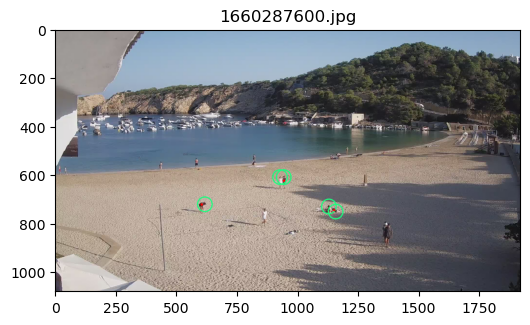

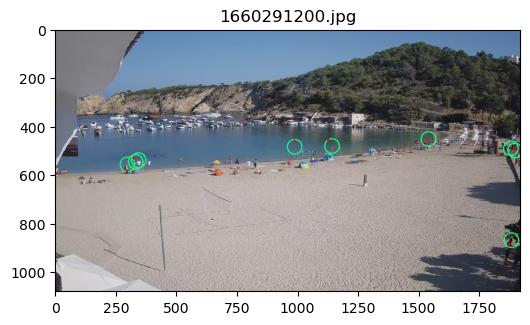

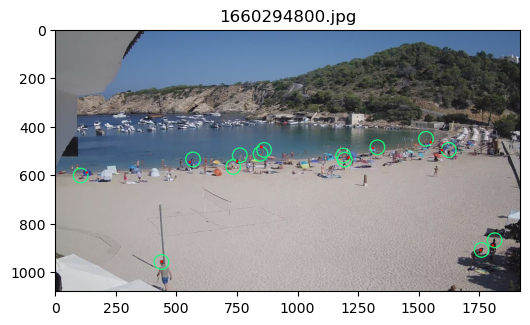

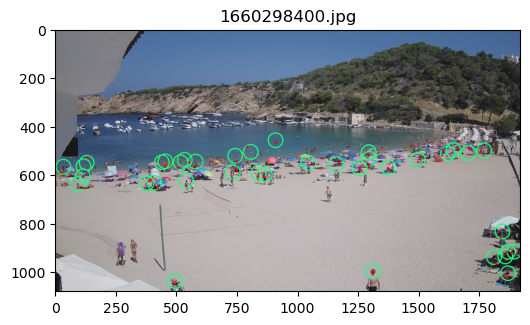

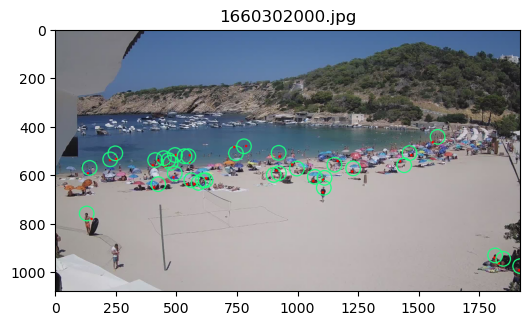

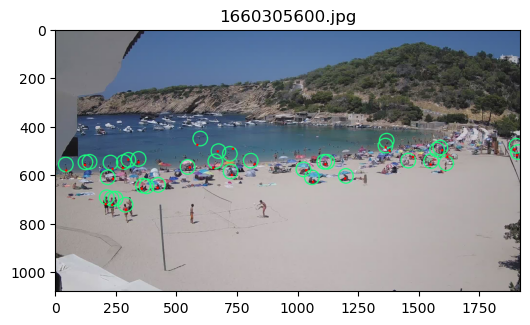

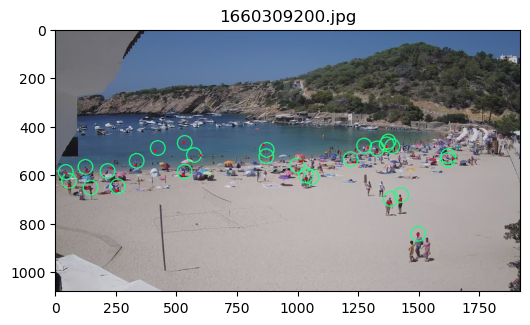

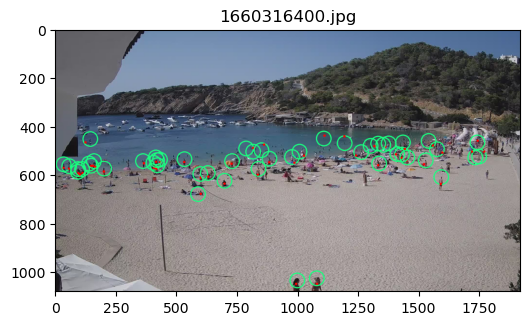

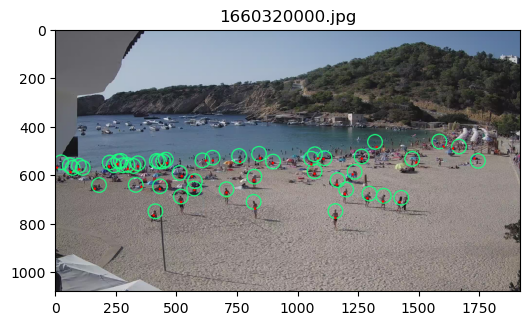

In [10]:
contour_person_eval = contour_detector.person_level_validation(radius=30,show_images=True)

In [11]:
contour_person_eval

,image_name,tp,fp,fn,precision,recall,f1score,accuracy
image_1,1660287600.jpg,5,65,14,0.071429,0.263158,0.112360,0.059524
image_2,1660291200.jpg,9,54,43,0.142857,0.173077,0.156522,0.084906
image_3,1660294800.jpg,14,74,52,0.159091,0.212121,0.181818,0.100000
image_4,1660298400.jpg,38,71,94,0.348624,0.287879,0.315353,0.187192
image_5,1660302000.jpg,34,97,73,0.259542,0.317757,0.285714,0.166667
image_6,1660305600.jpg,36,86,77,0.295082,0.318584,0.306383,0.180905
image_7,1660309200.jpg,27,74,68,0.267327,0.284211,0.275510,0.159763
image_8,1660316400.jpg,50,95,95,0.344828,0.344828,0.344828,0.208333
image_9,1660320000.jpg,50,106,105,0.320513,0.322581,0.321543,0.191571


A notable observation is the consistent low values of these metrics across all images, which indicates significant challenges in the algorithm's performance. True positives are relatively low, while both false positives and false negatives are high. This suggests that the model struggles to correctly identify positive instances while frequently misclassifying both positive and negative samples.

Precision is also low with a maximum value of 0.344828 for image_8. This indicates that the model often predicts positive labels incorrectly, leading to a high rate of false positives. Similarly, recall values are also low, ranging from 0.173077 for image_2 to 0.344828 for image_8. The low recall reveals that the model fails to detect a significant portion of actual positive instances, evidenced by the high number of false negatives.

Also looking at the The F1-score, which balances precision and recall, is also consistently poor, with its highest value being 0.344828 for image_8. These figures reflect the overall poor performance of the algorithm.

In [12]:
print(f"Average precision: {contour_person_eval['precision'].mean() * 100:.2f}%")
print(f"Average recall: {contour_person_eval['recall'].mean() * 100:.2f}%")
print(f"Average accuracy: {contour_person_eval['accuracy'].mean() * 100:.2f}%")
print(f"Average F1 score: {contour_person_eval['f1score'].mean() * 100:.2f}%")
print(f"Total true-positives: {contour_person_eval['tp'].sum()}")

Average precision: 24.55%
Average recall: 28.05%
Average accuracy: 14.88%
Average F1 score: 25.56%
Total true-positives: 263


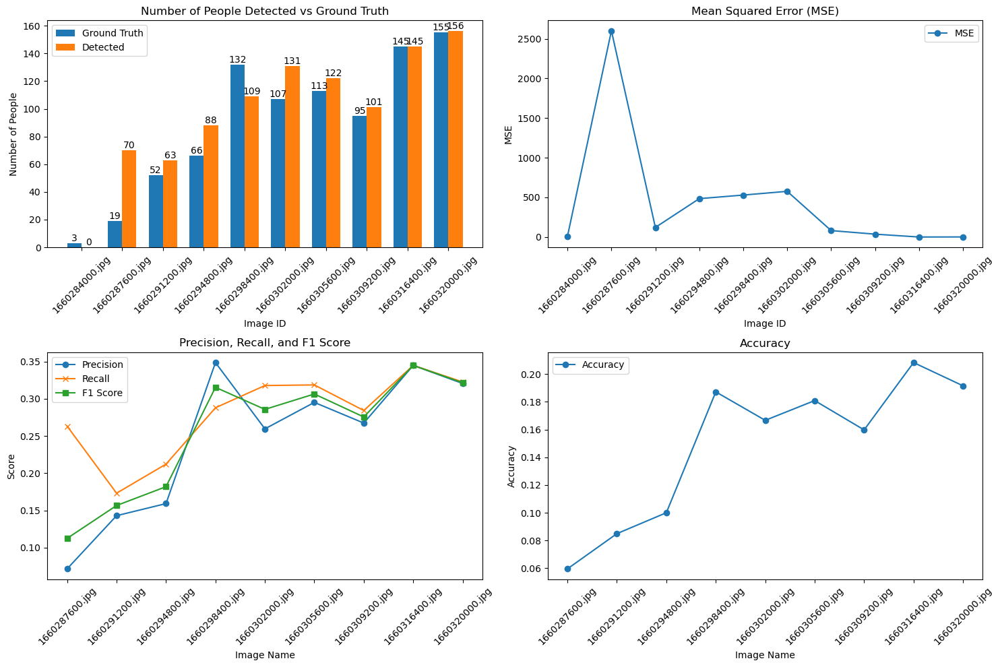

In [13]:
plot_validation_results(contour_image_eval, contour_person_eval)

### Connected Components Detection

In this section, we implement a second algorithm with the aim of increasing the precision of our technique. As opposed to the first algorithm, we used the connected components detection to identify objects in this approach. Connected Components labeling is a technique used to determine the connectivity of “blob”-like regions in a binary image. We often use connected component analysis in the same situations that contours are used; however, connected component labeling can often give us more granular filtering of the blobs in a binary image.

Connected components have an advantage over contour detection in that they provide a direct way to segment and label individual objects or regions in an image. Once labeled, we can easily compute region-specific properties like area, centroid, and bounding box. This is more challenging with contour detection, which might return multiple fragmented contours for the same object.

In [14]:
from src.ConnectedComponents import ConnectedComponents

In [15]:
connected = ConnectedComponents(manual_annotations=annotations)

In [16]:
# Set show_image to True to see the images as they are processed
connected_predictions = connected.process_images(show_image=False)

C:\Users\mraix\OneDrive\Documentos\1Semestre_24_25\imagenes\crowd_counting\src\PerformanceMonitor.py:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.metrics = pd.concat([self.metrics, new_row], ignore_index=True)


In [17]:
connected.metrics

,function,image_name,time_took,cpu_cycles,memory_usage,memory_peak
0,_process_image,1660287600.jpg,0.089566,0.156250,-1.94140625 MB,16.590744 MB
1,_process_image,1660291200.jpg,0.078673,0.046875,-0.1484375 MB,16.58984 MB
2,_process_image,1660294800.jpg,0.079542,0.078125,0.11328125 MB,16.58984 MB
3,_process_image,1660298400.jpg,0.079691,0.046875,0.453125 MB,16.737797 MB
4,_process_image,1660302000.jpg,0.078384,0.125000,-0.2890625 MB,16.58984 MB
5,_process_image,1660305600.jpg,0.078859,0.171875,0.26953125 MB,16.58984 MB
6,_process_image,1660309200.jpg,0.077142,0.046875,0.359375 MB,16.58984 MB
7,_process_image,1660316400.jpg,0.075361,0.015625,-0.2734375 MB,16.58984 MB
8,_process_image,1660320000.jpg,0.077888,0.203125,1.2421875 MB,16.58984 MB


In [18]:
connected_image_eval, connected_mean_mse = connected.image_level_validation()

In [19]:
print("Image Level Validation: ", end="\n\n")
print(connected_image_eval)
print("Mean MSE: ", connected_mean_mse)

Image Level Validation: 

  image_id  people  people_gt      image_name     mse     %\error
0  image_0     0.0          3  1660284000.jpg     9.0  100.000000
1  image_1    31.0         19  1660287600.jpg   144.0   63.157895
2  image_2    42.0         52  1660291200.jpg   100.0   19.230769
3  image_3    75.0         66  1660294800.jpg    81.0   13.636364
4  image_4   105.0        132  1660298400.jpg   729.0   20.454545
5  image_5   115.0        107  1660302000.jpg    64.0    7.476636
6  image_6   107.0        113  1660305600.jpg    36.0    5.309735
7  image_7   103.0         95  1660309200.jpg    64.0    8.421053
8  image_8   110.0        145  1660316400.jpg  1225.0   24.137931
9  image_9   118.0        155  1660320000.jpg  1369.0   23.870968
Mean MSE:  382.1


Compared to the contour detection used above, this technique has a better performance with a Mean MSE of 382 which is 14% lower than the previous. Additionally, we can observe the reduced percentage of error across board. This algorithm tends to perform better on almost all images showcasing similar performace except extreme cases such as image_1.

Below, the detections on the images are displayed and the person level evaluations are explained below:

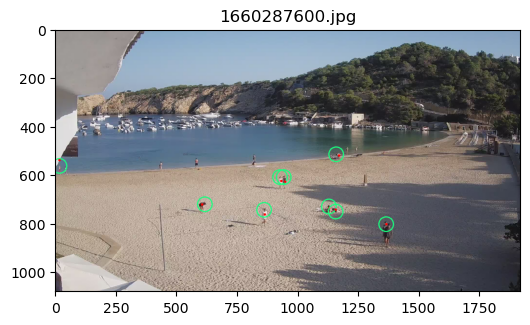

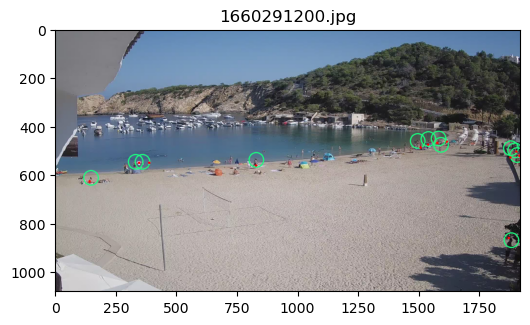

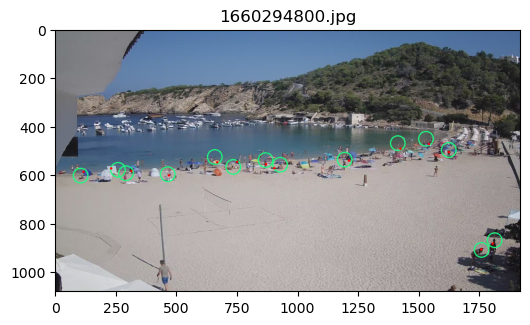

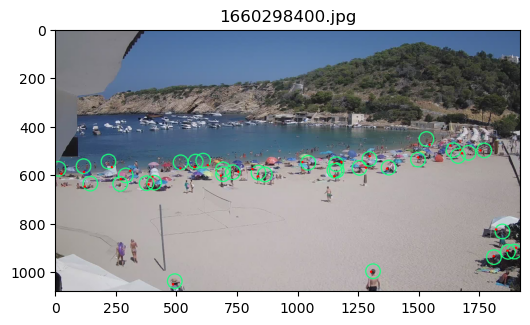

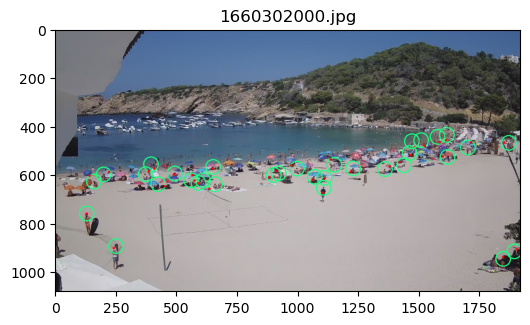

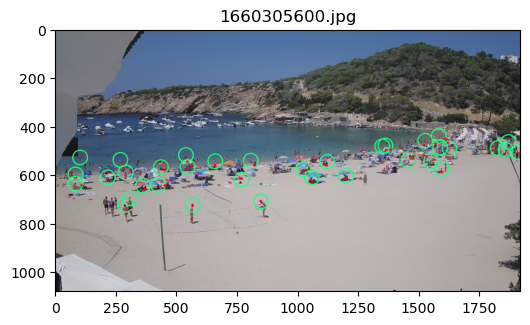

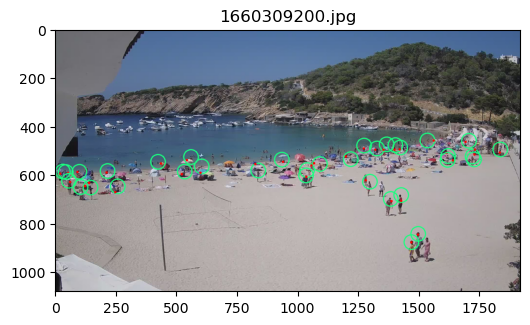

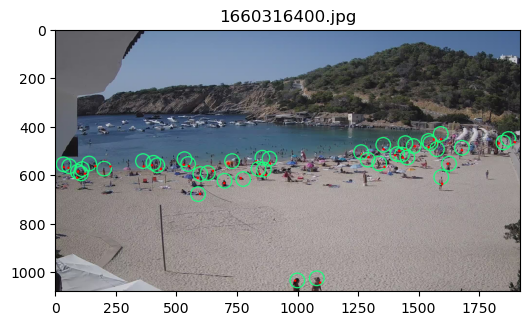

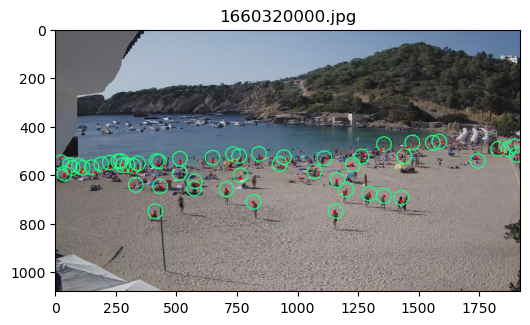

In [20]:
connected_person_eval = connected.person_level_validation(radius=30, show_images=True)

In [21]:
connected_person_eval

,image_name,tp,fp,fn,precision,recall,f1score,accuracy
image_1,1660287600.jpg,9,22,10,0.290323,0.473684,0.360000,0.219512
image_2,1660291200.jpg,12,30,40,0.285714,0.230769,0.255319,0.146341
image_3,1660294800.jpg,14,61,52,0.186667,0.212121,0.198582,0.110236
image_4,1660298400.jpg,35,70,97,0.333333,0.265152,0.295359,0.173267
image_5,1660302000.jpg,33,82,74,0.286957,0.308411,0.297297,0.174603
image_6,1660305600.jpg,35,72,78,0.327103,0.309735,0.318182,0.189189
image_7,1660309200.jpg,35,68,60,0.339806,0.368421,0.353535,0.214724
image_8,1660316400.jpg,42,68,103,0.381818,0.289655,0.329412,0.197183
image_9,1660320000.jpg,53,65,102,0.449153,0.341935,0.388278,0.240909


The model shows some performance improvements in the crowd counting tasks. True positives increased slightly, but false positives and negatives remain problematic across all images, indicating ongoing difficulties in accurate prediction.

Precision varies significantly between images, ranging from 0.449153 (image_9) to 0.186667 (image_3). This inconsistency suggests the model's performance is heavily influenced by image-specific factors. Recall values are generally low, with the highest at 0.473684 (image_1), showing the model still struggles to detect many positive instances.

While the model still struggles with the images due to their inherent complexity, this technique provided better results compared to our previous contour detection approach. The metrics are summarised below.

In [22]:
print(f"Average precision: {connected_person_eval['precision'].mean() * 100:.2f}%")
print(f"Average recall: {connected_person_eval['recall'].mean() * 100:.2f}%")
print(f"Average accuracy: {connected_person_eval['accuracy'].mean() * 100:.2f}%")
print(f"Average F1 score: {connected_person_eval['f1score'].mean() * 100:.2f}%")
print(f"Total true-positives: {connected_person_eval['tp'].sum()}")

Average precision: 32.01%
Average recall: 31.11%
Average accuracy: 18.51%
Average F1 score: 31.07%
Total true-positives: 268


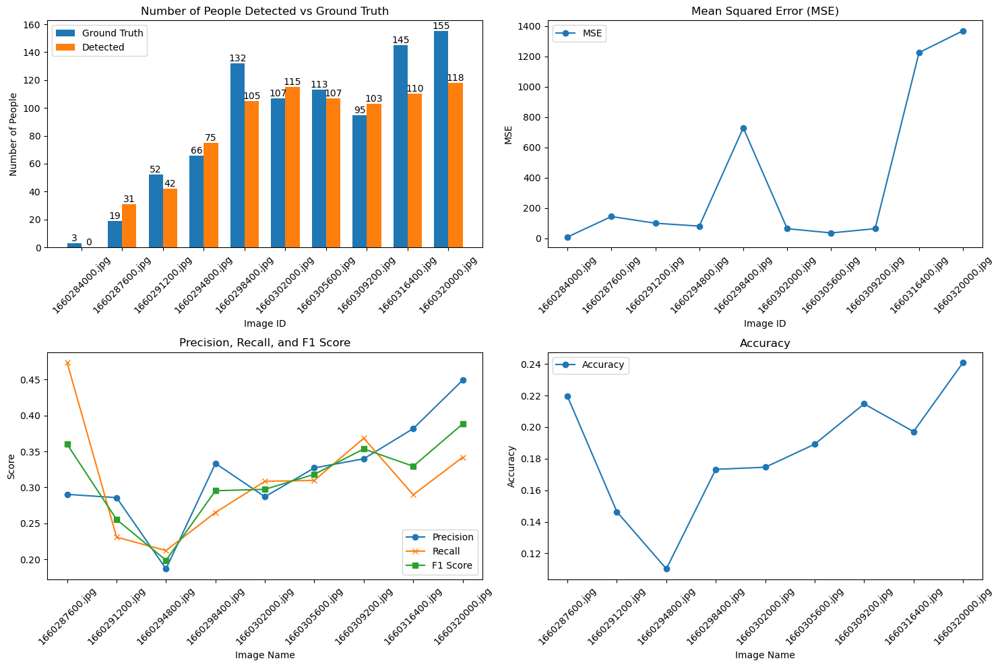

In [23]:
plot_validation_results(connected_image_eval, connected_person_eval)

### Comparison with Deep Learning - YOLO

To compare our solution to state-of-the-art computer vision approaches, we benchmarked our results using the YOLO model. YOLO is a CNN based computer vision model capable of diverse tasks such as object detection, segmentation etc. The model is trained on significantly large datasets and continues to showcase impressive results acorss computer vision tasks.

In [24]:
from ultralytics import YOLO

In [25]:
model = YOLO('yolov8m.pt')  
classes = [0]


0: 384x640 12 persons, 230.2ms
Speed: 2.5ms preprocess, 230.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 205.2ms
Speed: 2.0ms preprocess, 205.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 216.9ms
Speed: 2.2ms preprocess, 216.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 12 persons, 208.7ms
Speed: 2.0ms preprocess, 208.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 persons, 205.8ms
Speed: 2.0ms preprocess, 205.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 7 persons, 218.3ms
Speed: 4.0ms preprocess, 218.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 9 persons, 212.1ms
Speed: 2.0ms preprocess, 212.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 11 persons, 227.1ms
Speed: 2.5ms preprocess, 227.1ms inference, 1.5ms postprocess p

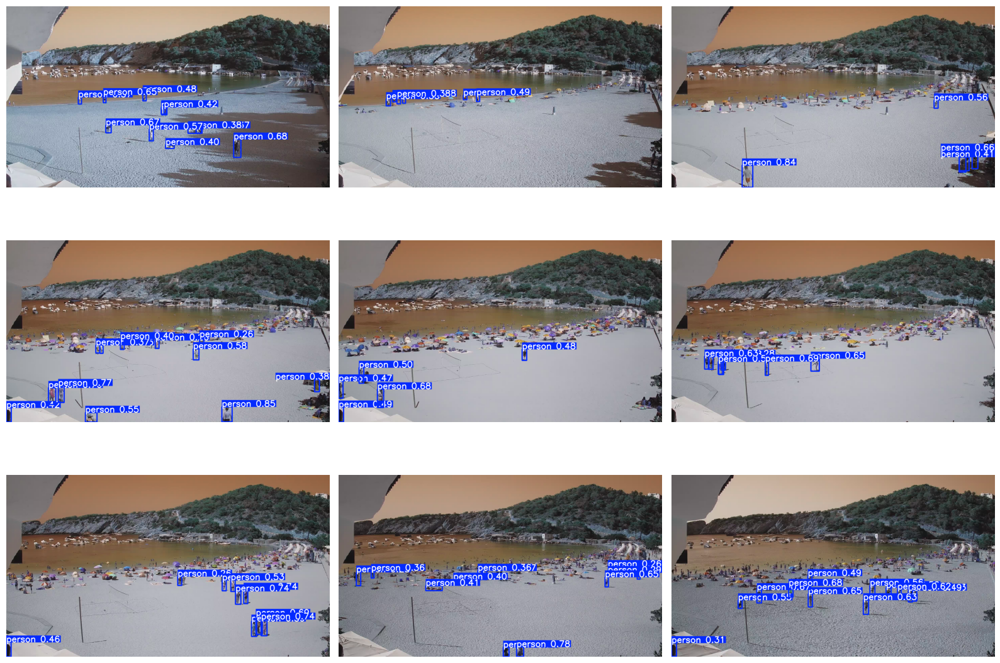

In [26]:
yolo_preds = {}

fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for idx, (ax, row) in enumerate(zip(axs.flatten(), annotations['image_name'].unique()[1:]), start=1):
    img_path = os.path.join('./data', row)
    img = cv2.imread(img_path)
    img_yolo = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = model(img_yolo, classes=classes)
    annotated_img = results[0].plot() 
    yolo_preds[row] = results[0].boxes.xywh.shape[0]
    
    ax.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
    ax.axis('off')
    
plt.tight_layout()
plt.show()

In [27]:
combined_eval = pd.merge(contour_image_eval, connected_image_eval, on='image_name', suffixes=('_contour', '_connected'))

yolo_preds_df = pd.DataFrame(list(yolo_preds.items()), columns=['image_name', 'people_yolo'])

final_combined_eval = pd.merge(combined_eval, yolo_preds_df, on='image_name')
final_combined_eval = final_combined_eval.drop(columns=['image_id_connected', 'people_gt_connected'])
final_combined_eval = final_combined_eval.rename(columns={'people_gt_contour': 'people_gt', 'image_id_contour': 'image_id'})

combined_eval_cols = ['image_name', 'image_id', 'people_gt', 'people_contour', 'mse_contour', 'people_connected', 'mse_connected', 'people_yolo']

final_combined_eval = final_combined_eval[combined_eval_cols]
final_combined_eval['mse_yolo'] = np.power(final_combined_eval['people_yolo'] - final_combined_eval['people_gt'], 2)

final_combined_eval

,image_name,image_id,people_gt,people_contour,mse_contour,people_connected,mse_connected,people_yolo,mse_yolo
0,1660287600.jpg,image_1,19,70.0,2601.0,31.0,144.0,12,49
1,1660291200.jpg,image_2,52,63.0,121.0,42.0,100.0,6,2116
2,1660294800.jpg,image_3,66,88.0,484.0,75.0,81.0,5,3721
3,1660298400.jpg,image_4,132,109.0,529.0,105.0,729.0,12,14400
4,1660302000.jpg,image_5,107,131.0,576.0,115.0,64.0,5,10404
5,1660305600.jpg,image_6,113,122.0,81.0,107.0,36.0,7,11236
6,1660309200.jpg,image_7,95,101.0,36.0,103.0,64.0,9,7396
7,1660316400.jpg,image_8,145,145.0,0.0,110.0,1225.0,11,17956
8,1660320000.jpg,image_9,155,156.0,1.0,118.0,1369.0,12,20449


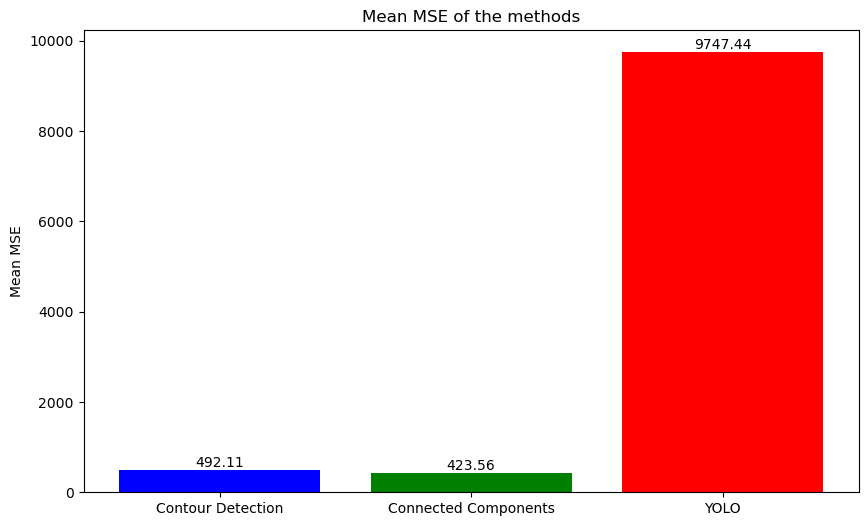

In [28]:
mean_mse_contour = final_combined_eval['mse_contour'].mean()
mean_mse_connected = final_combined_eval['mse_connected'].mean()
mean_mse_yolo = final_combined_eval['mse_yolo'].mean()

mse_data = pd.DataFrame({
    'Method': ['Contour Detection', 'Connected Components', 'YOLO'],
    'Mean MSE': [mean_mse_contour, mean_mse_connected, mean_mse_yolo]
})

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(mse_data['Method'], mse_data['Mean MSE'], color=['blue', 'green', 'red'])

for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 0.05, round(yval, 2), ha='center', va='bottom')

ax.set_title('Mean MSE of the methods')
ax.set_ylabel('Mean MSE')
plt.show()

The bar chart above demonstrates that the contour detection and connected components methods significantly outperformed YOLO in terms of Mean Squared Error (MSE) when tested on the crowd counting images. The MSE values for contour detection and connected components are 492.11 and 423.56, respectively, whereas YOLO’s MSE is drastically higher at 9747.44. This stark difference suggests that YOLO is struggling to achieve accurate predictions for this specific dataset.

YOLO is a deep learning-based object detection model that performs best on datasets with clear, well-structured annotations and sufficient training diversity. In our images where they showcase characteristics such as high noise, low resolution and diffrent overlapping objects such as umbrellas etc, YOLO might fail to detect objects accurately leading to high errors. This is because in such images, the YOLO model could not identify the features from the objects correctly and therefore could not identify images correctly.
